# Generate the hidden message

In [1]:
import pydub 
import math
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
plt.rcParams['figure.figsize'] = [15, 10]

In [2]:
# Define a function to read in an MP3
def read(f, normalized=False):
    """MP3 to numpy array"""
    a = pydub.AudioSegment.from_mp3(f)
    y = np.array(a.get_array_of_samples())
    if a.channels == 2:
        y = y.reshape((-1, 2))
    if normalized:
        return a.frame_rate, np.float32(y) / 2**15
    else:
        return a.frame_rate, y

In [3]:
def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(data, cutoff, fs, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    y = signal.filtfilt(b, a, data)
    return y

def butter_lowpass(cutoff, fs, order=128):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    sos = signal.butter(order, normal_cutoff, btype='low', output='sos', analog=False)
    return sos

def butter_lowpass_filter(data, cutoff, fs, order=128):
    sos = butter_lowpass(cutoff, fs, order=order)
    y = signal.sosfiltfilt(sos, data)
    return y

Read in our original audio

In [4]:
# Read in our audio and convert it to mono
with open('speech_20210920202218985.mp3', 'rb') as f:
    samples = read(f, normalized=True)
    samplerate = samples[0]
    audio = samples[1][0:247100]

totalTime = len(audio)/samplerate
t = np.linspace(0, totalTime, len(audio))

tmp = samplerate
samplerate = 44100
audio, t = signal.resample(audio, int(samplerate/tmp) * len(audio), t);
audio = audio + 0j

Play the sound

In [5]:
ipd.Audio(np.real(audio), rate=samplerate)

In [6]:
spectrum = np.abs(np.fft.fftshift(np.fft.fft(audio)))

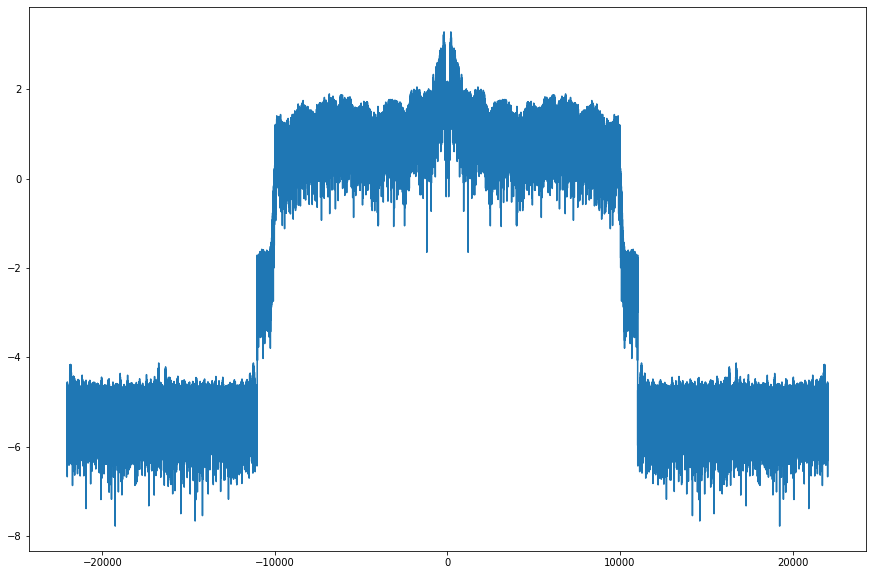

In [7]:
plt.plot(np.linspace(-samplerate / 2, samplerate / 2, len(spectrum)), np.log10(spectrum))
plt.show()

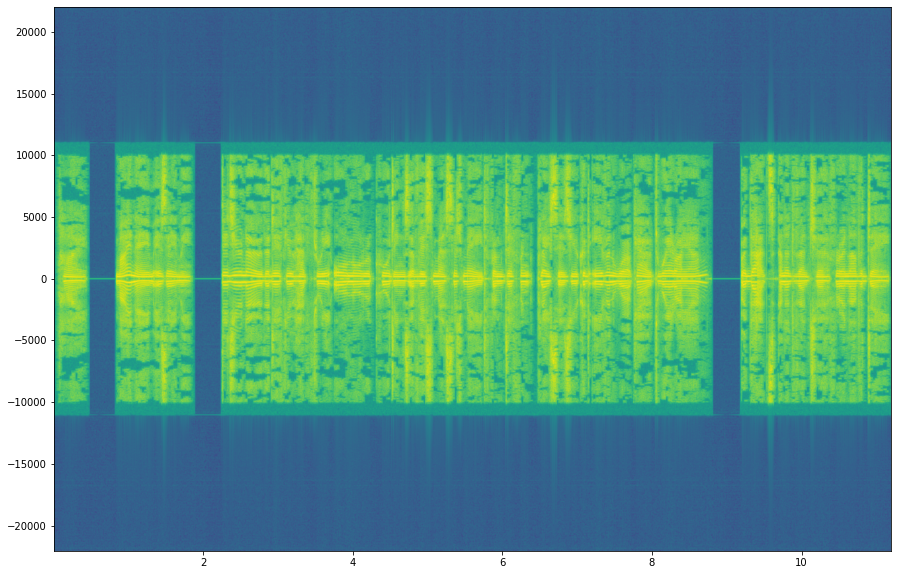

In [8]:
plt.specgram(audio+1e-5, NFFT=1024, Fs=samplerate, noverlap=900)
plt.show()

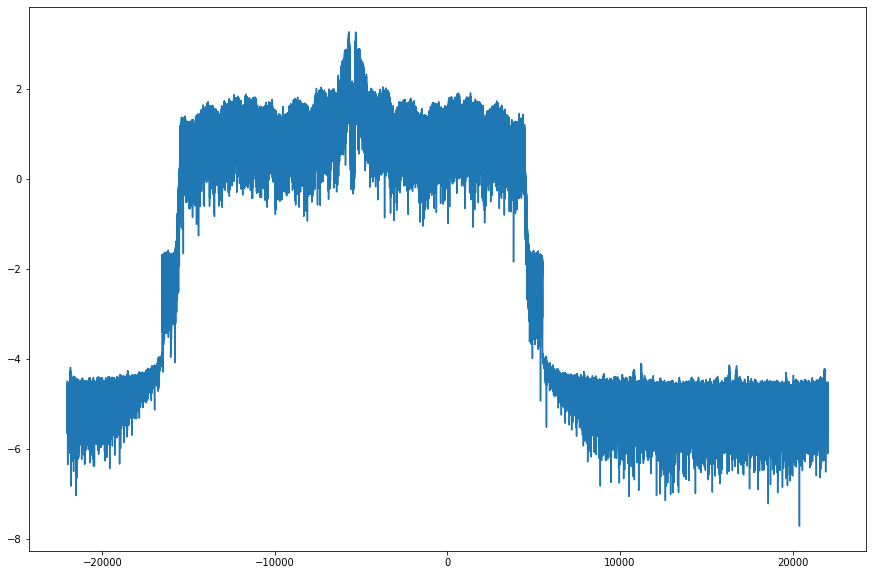

In [9]:
# Mix to baseband
mixFreq = -samplerate / 8
mixTone = np.sin(-2*np.pi*mixFreq*t) + 1j * np.cos(-2*np.pi*mixFreq*t)
mixedOriginalAudio = audio * mixTone

spectrum = np.abs(np.fft.fftshift(np.fft.fft(mixedOriginalAudio)))
plt.plot(np.linspace(-samplerate / 2, samplerate / 2, len(spectrum)), np.log10(spectrum))
plt.show()

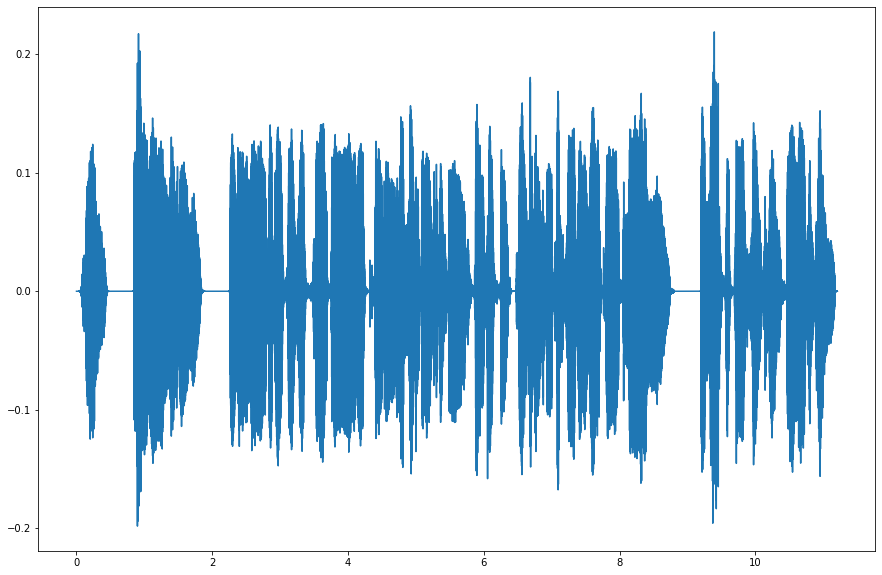

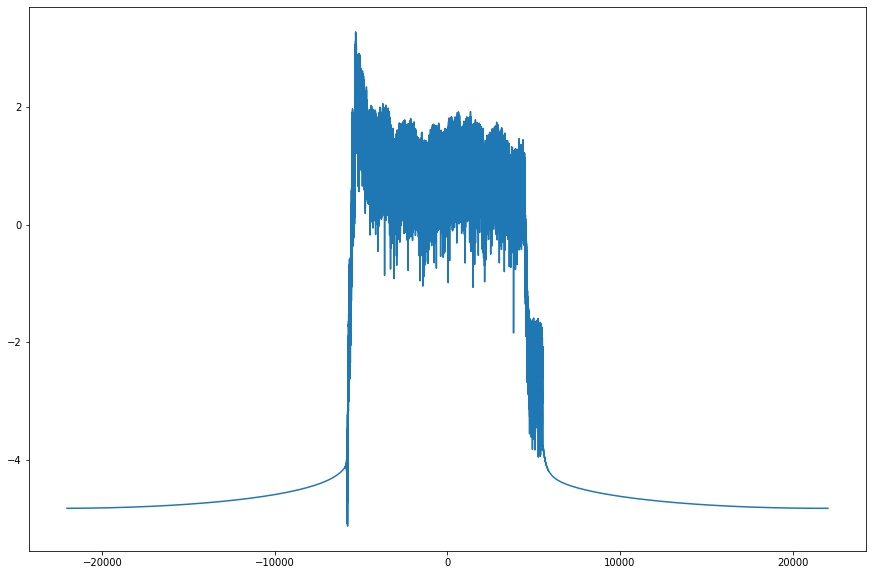

In [10]:
# Filter
filteredOriginalAudio = butter_lowpass_filter(mixedOriginalAudio, samplerate / 8, samplerate)
plt.plot(t, np.real(filteredOriginalAudio))
plt.show()

spectrum = np.abs(np.fft.fftshift(np.fft.fft(filteredOriginalAudio)))
plt.plot(np.linspace(-samplerate / 2, samplerate / 2, len(spectrum)), np.log10(spectrum))
plt.show()

In [11]:
# Test we can get the audio back from this state
mixFreq = samplerate / 8
mixTone = np.sin(-2*np.pi*mixFreq*t) + 1j * np.cos(-2*np.pi*mixFreq*t)
mixedAudio = filteredOriginalAudio * mixTone
ipd.Audio(np.real(mixedAudio), rate=samplerate)

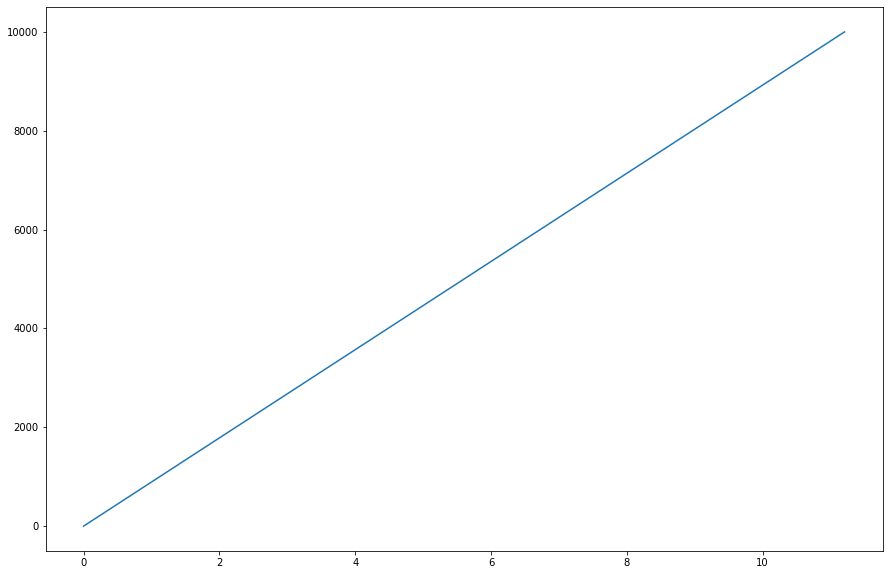

In [12]:
# Generate chirp

tChirp = t[0:math.floor(len(t))]
chirpFreq = 10000 * tChirp / np.max(tChirp)
# chirpFreq = np.concatenate((chirpFreq, chirpFreq, chirpFreq, chirpFreq, chirpFreq))
plt.plot(t, chirpFreq)


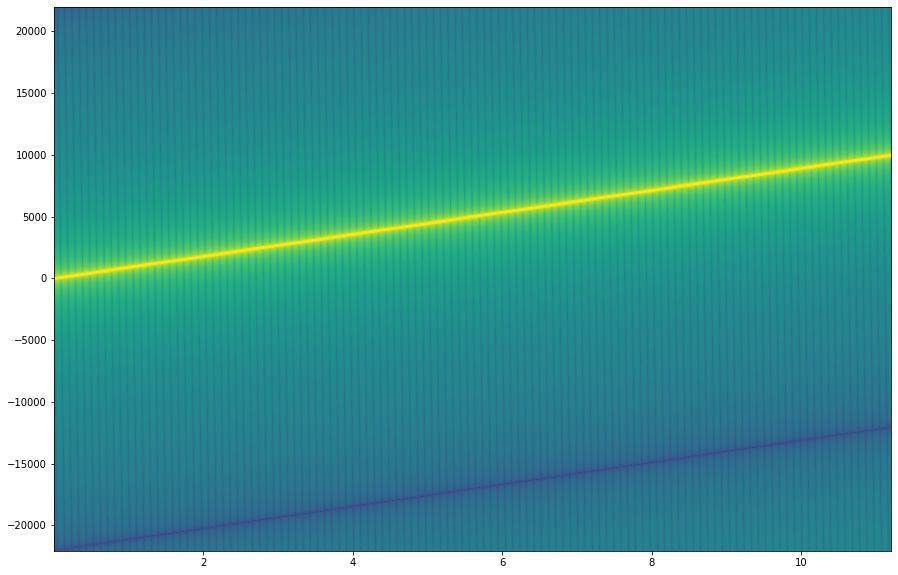

In [13]:
chirpSignal = np.exp(1j * np.pi * chirpFreq * t)
plt.specgram(chirpSignal, NFFT=512, Fs=samplerate, noverlap=256)
plt.show()

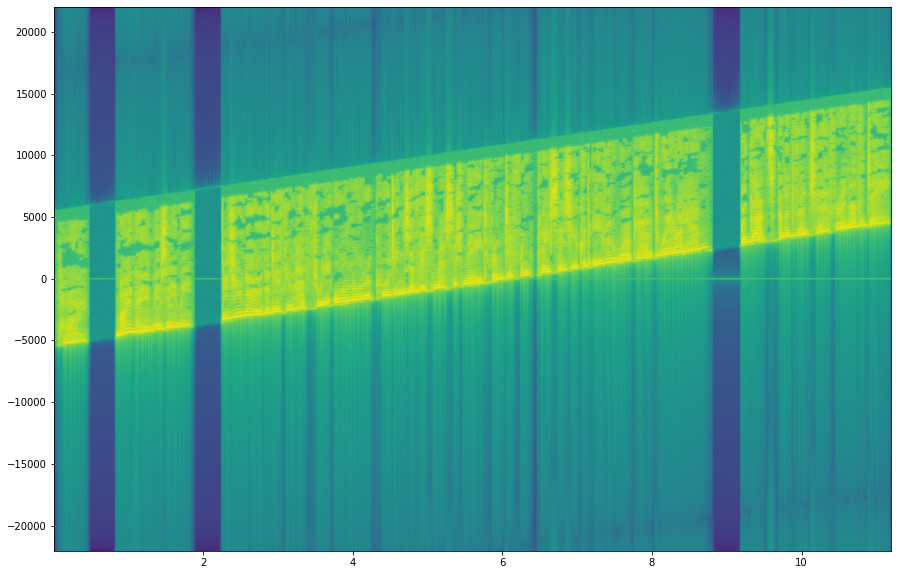

In [14]:
chirped = filteredOriginalAudio * chirpSignal
plt.specgram(chirped+1e-6, NFFT=1024, Fs=samplerate, noverlap=900)
plt.show()

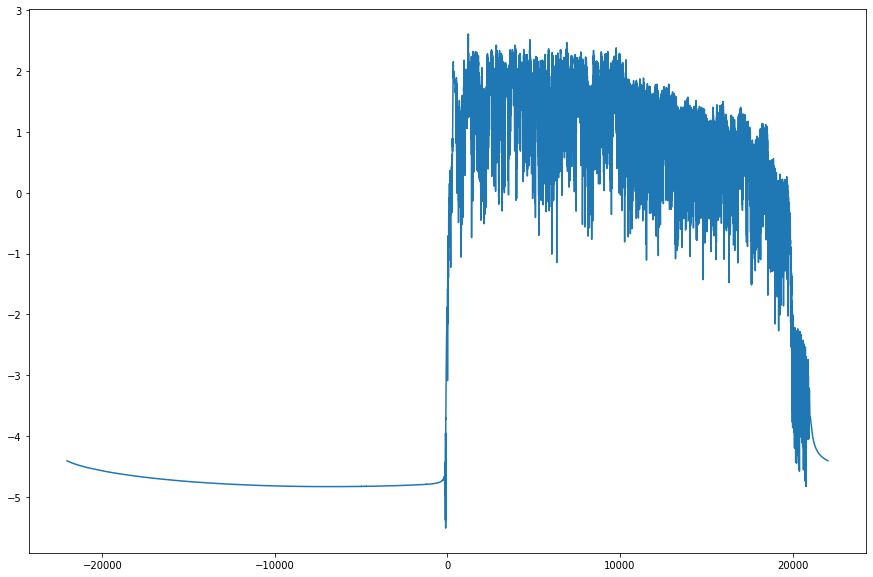

In [15]:
# Mix to baseband
mixFreq = samplerate / 8
mixTone = np.sin(-2*np.pi*mixFreq*t) + 1j * np.cos(-2*np.pi*mixFreq*t)
mixedAudio = chirped * mixTone

spectrum = np.abs(np.fft.fftshift(np.fft.fft(mixedAudio)))
plt.plot(np.linspace(-samplerate / 2, samplerate / 2, len(spectrum)), np.log10(spectrum))
plt.show()


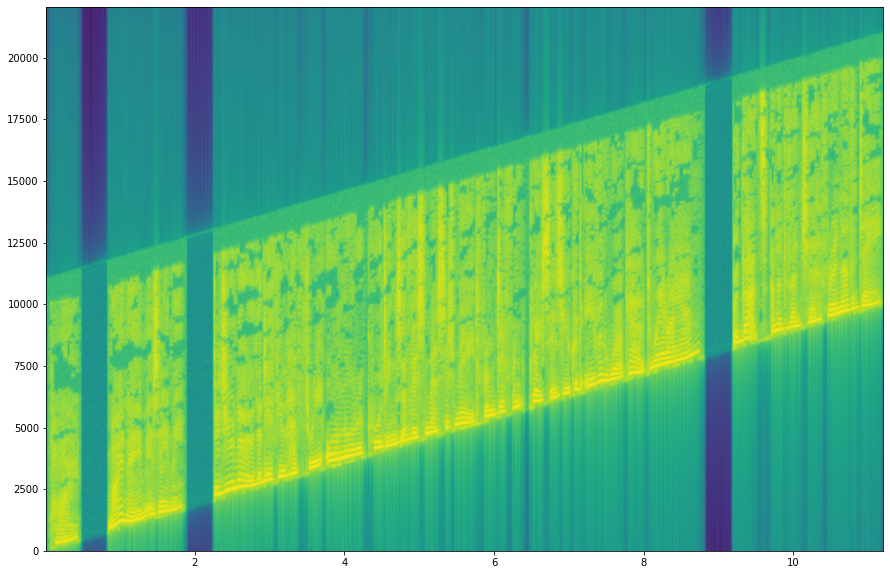

In [16]:
plt.specgram(np.real(mixedAudio), NFFT=1024, Fs=samplerate, noverlap=900)
plt.show()

In [17]:
finalAudio = np.real(mixedAudio)

# Lets find the hidden message!

We've received some sound that we've been told contains a secret message but no-one can understand it!

Lets have a listen and see what we can hear:

In [18]:
ipd.Audio(finalAudio, rate=samplerate)

There is definitely something there, it seems to start with "Hi", after that it all goes funny, lets see if we can figure this out.

You can describe a sound using a **waveform**. This is a series of points desribing the sounds **amplitude** over time.

Lets look at some of this waveform. Here is the whole thing:

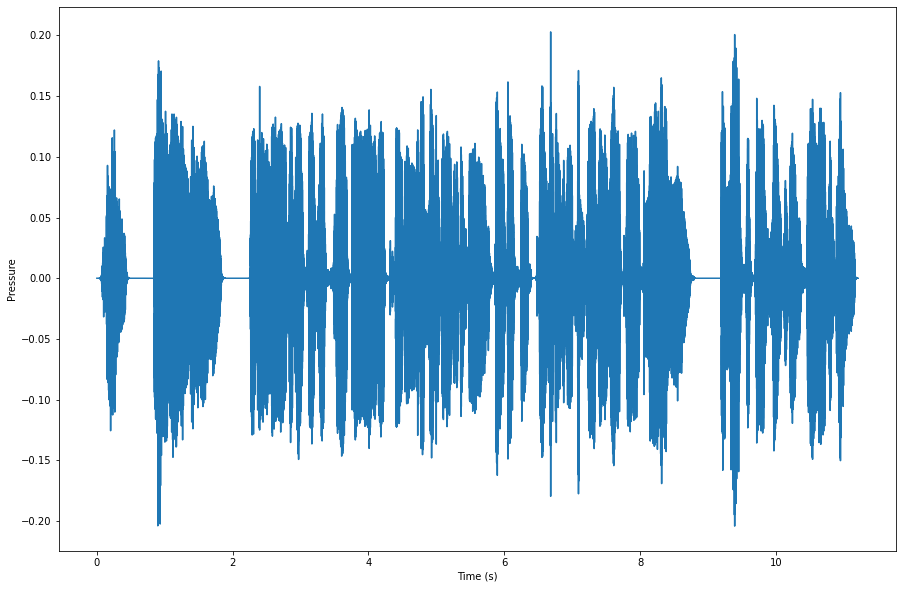

In [19]:
plt.plot(t, finalAudio); plt.xlabel('Time (s)'); plt.ylabel('Pressure');
plt.show()

Here is a small section of it, zoomed in:

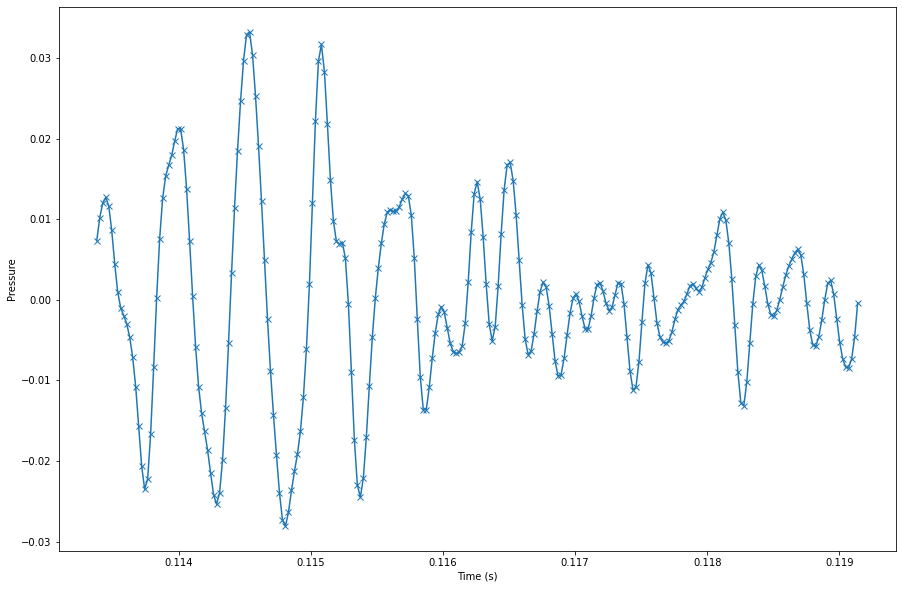

In [20]:
plt.plot(t[5000:5255], finalAudio[5000:5255], '-x'); plt.xlabel('Time (s)'); plt.ylabel('Pressure');
plt.show()

## So where to start?

We need to start making sense of this waveform/signal (I'll use the terms interchangably). We've already looked at the the signal in the time view, and it didn't show us very much.

Is there any other way we can look at this signal?

Turns out there is... we just need to look at this signal using a different set of axes instead of time and amplitude.

### Change of Basis

As an example, you can measure a co-ordinate using cartesian ($x$ and $y$) but you can also use *polar* co-ordinates ($r$ and $\theta$).

![](https://1ugn2l2m3z2y31d4y73c1m5w-wpengine.netdna-ssl.com/wp-content/uploads/2019/10/Polar-and-Cartesian-Coordinate-Systems.png)

For a signal like this, its useful to look at the **frequencies** in the signal.

Fourier analysis tells us that it is possible to represent any complex signal as the sum of a series of sine and cosine signals.

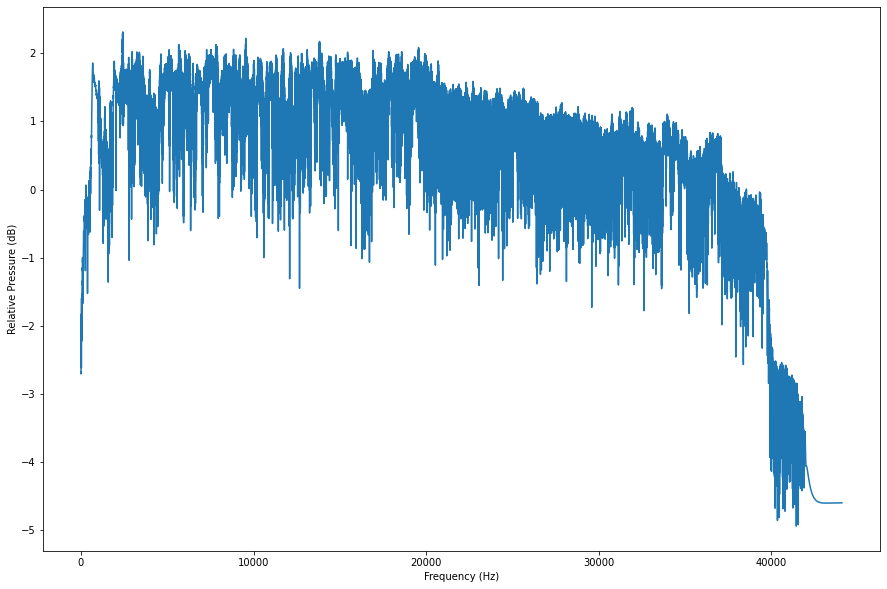

In [21]:
spectrum = np.abs(np.fft.rfft(finalAudio))
plt.plot(np.linspace(0, samplerate, len(spectrum)), np.log10(spectrum)); plt.xlabel('Frequency (Hz)'); plt.ylabel('Relative Pressure (dB)');
plt.show()

Hmm, not very informative... Maybe we could look at the *frequency spectrum* over just some of the signal:

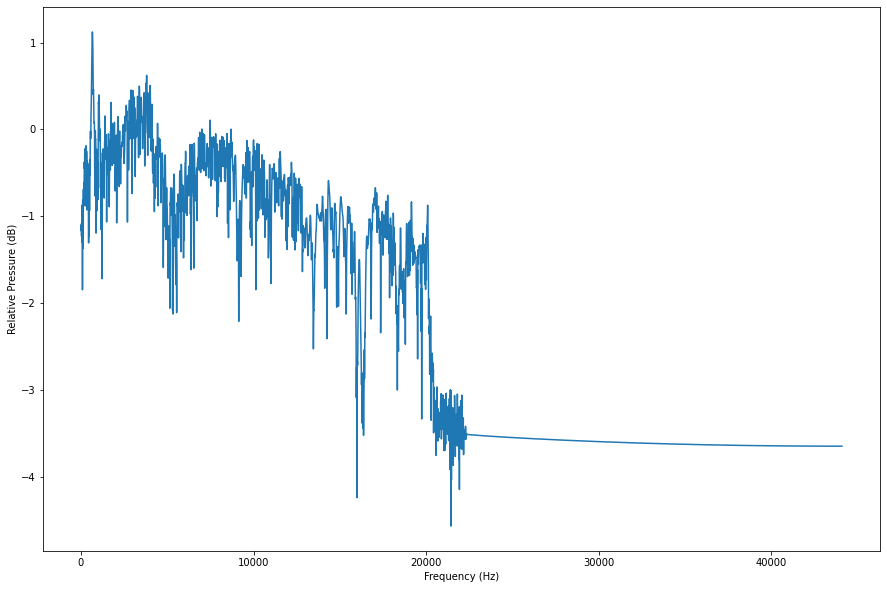

In [36]:
spectrum = np.abs(np.fft.rfft(signal.hamming(8192) * finalAudio[0:8192]))
plt.plot(np.linspace(0, samplerate, len(spectrum)), np.log10(spectrum)); plt.xlabel('Frequency (Hz)'); plt.ylabel('Relative Pressure (dB)');
plt.show()

Now this is different, we only have **low** frequency components... Lets look at bits near the end:

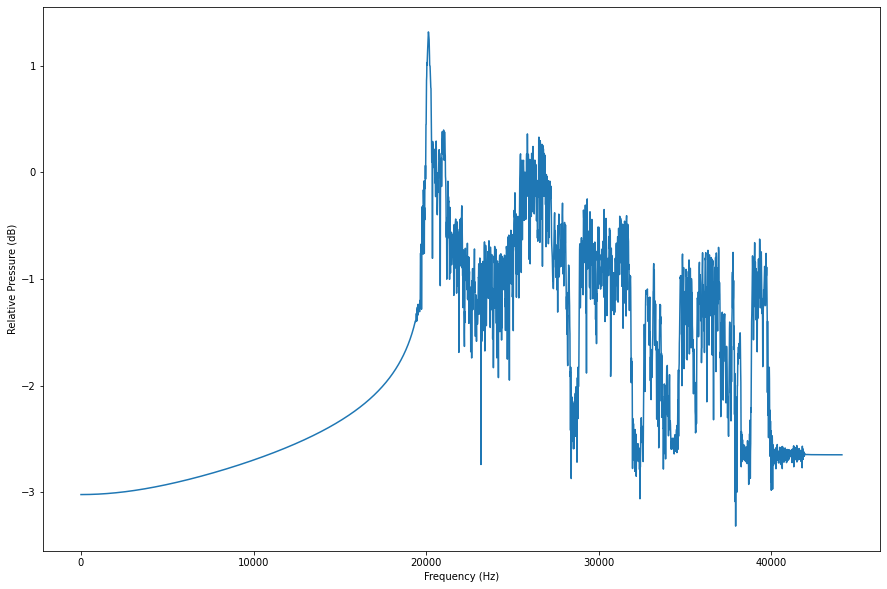

In [37]:
spectrum = np.abs(np.fft.rfft(signal.hamming(8192) * finalAudio[len(finalAudio)-8193:len(finalAudio) - 1]))
plt.plot(np.linspace(0, samplerate, len(spectrum)), np.log10(spectrum)); plt.xlabel('Frequency (Hz)'); plt.ylabel('Relative Pressure (dB)');
plt.show()

Only high frequency components! What if we were able to look at how the frequency components changed over time...

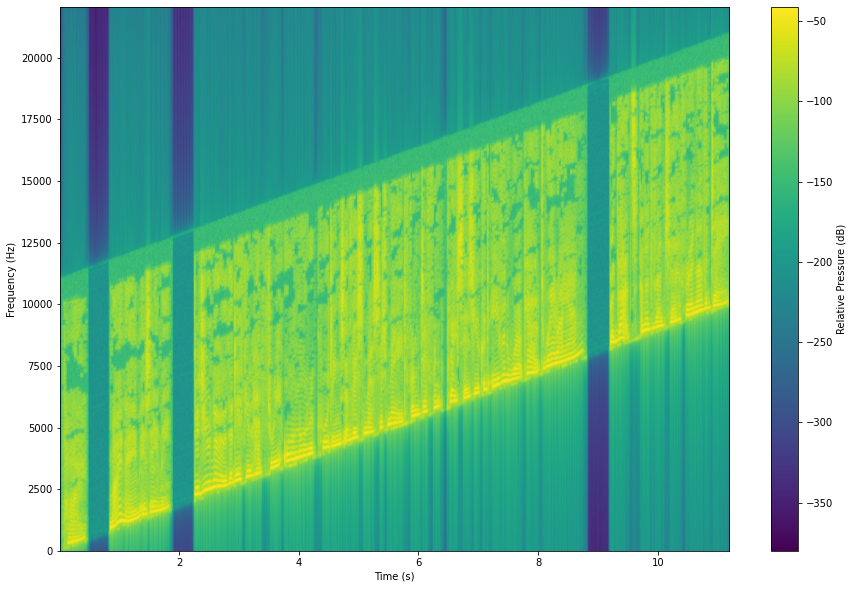

In [24]:
plt.specgram(finalAudio, NFFT=1024, Fs=samplerate, noverlap=900); plt.xlabel('Time (s)'); plt.ylabel('Frequency (Hz)'); plt.colorbar().set_label('Relative Pressure (dB)');
plt.show()

### Now we're getting somewhere!
The signal is **constantly changing** in frequency!

Now we need to see if we can undo this effect.

What we want to do is called a *frequency shift*, we can do this using a technique called *mixing*.

We make use of the following identities:
$$ \sin(\alpha + \beta) = \sin(\alpha)\cos(\beta) + \cos(\alpha)\sin(\beta) $$
$$ \cos(\alpha + \beta) = \cos(\alpha)\cos(\beta) + \sin(\alpha)\sin(\beta) $$

To make use of them we have to represent our signal as a *complex* signal of the form:
$$ s(\omega t) = \cos(2 \pi \omega t) + i\sin(2 \pi \omega t) = e^{2 \pi i \omega t}$$

Now time for the algebra... Go!!!
$$\begin{aligned}
s'(\omega t) &= \cos(2 \pi (\omega + \delta) t) + i\sin(2 \pi (\omega + \delta) t) \\
         &= \cos(2 \pi \omega t)\cos(2 \pi \delta t) + \sin(2 \pi \omega t)\sin(2 \pi \delta t) + i(\sin(2 \pi \omega t)\cos(2 \pi \delta t) + \cos(2 \pi \omega t)\sin(2 \pi \delta t))\\
         &= (\cos(2 \pi \omega t) + i\sin(2 \pi \omega t)) (\cos(2 \pi \delta t) + i\sin(2 \pi \delta t))\\
         &= s(\omega t) f(\delta t)
\end{aligned}$$

So we have the original signal, **multiplied by a sine wave at the frequency we want to shift by**.

### Convert to complex

In [25]:
cAudio = finalAudio + 0j

### Mix down to baseband
First we need to create our new sine wave, the $f(\delta t)$ from above.

In [38]:
# Mix to baseband
mixFreq = -samplerate / 4
mixTone = np.sin(-2*np.pi*mixFreq*t) + 1j * np.cos(-2*np.pi*mixFreq*t)

Now multiply with our signal:

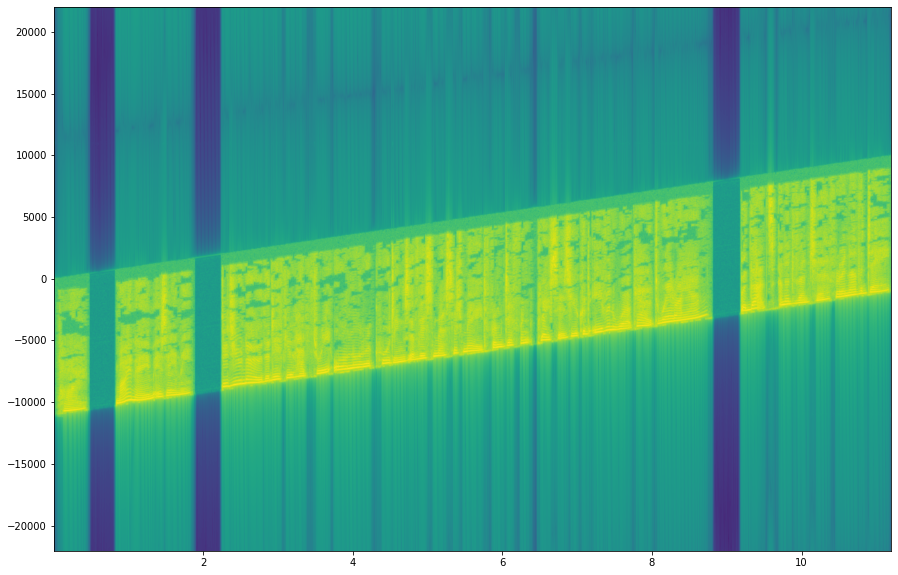

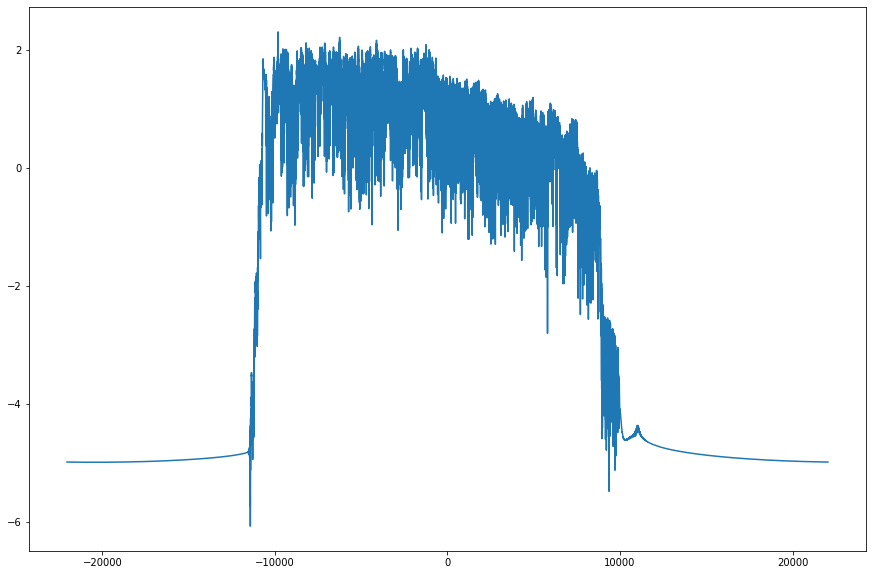

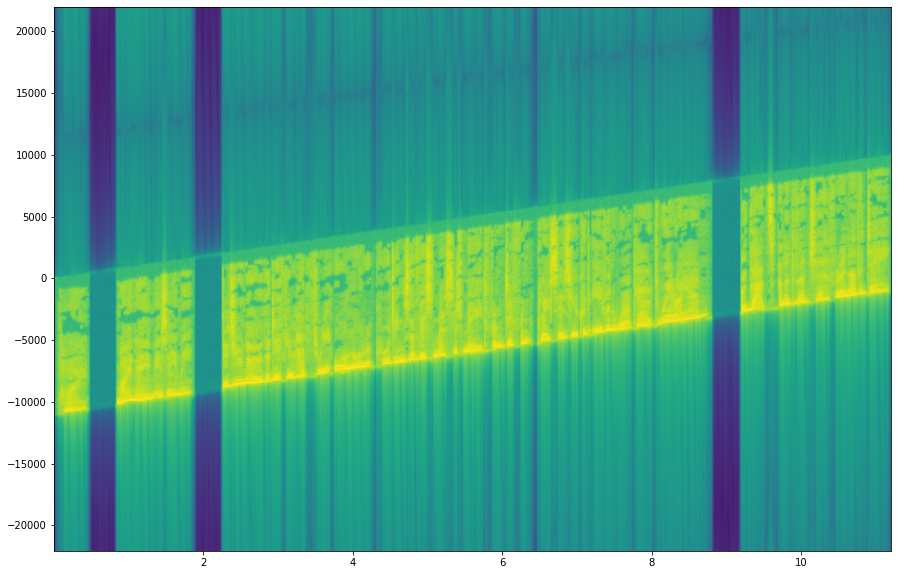

In [40]:
mixedAudio = cAudio * mixTone

filteredChirpAudio = butter_lowpass_filter(mixedAudio, samplerate / 4, samplerate)

plt.specgram(filteredChirpAudio, NFFT=1024, Fs=samplerate, noverlap=900)
plt.show()

spectrum = np.abs(np.fft.fftshift(np.fft.fft(filteredChirpAudio)))

plt.plot(np.linspace(-samplerate / 2, samplerate / 2, len(spectrum)), np.log10(spectrum))
plt.show()

plt.specgram(filteredChirpAudio, NFFT=512, Fs=samplerate, noverlap=256)
plt.show()

### Now we want to mix with a signal whose frequency is constantly changing
Start by generating a sine wave with an increasingly *negative* frequency.

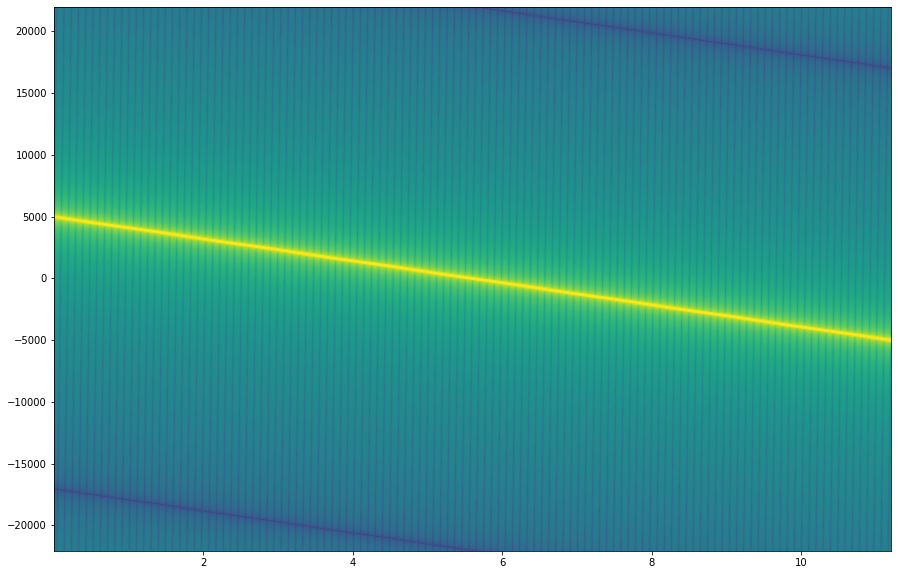

In [41]:
# Generate dechirp
tChirp = t[0:len(t)]
chirpFreq = -10000 * tChirp / (2* t[len(t)-1]) + 10000/2
chirpSignal = np.exp(2j * np.pi * chirpFreq * t)
plt.specgram(chirpSignal, NFFT=512, Fs=samplerate, noverlap=256)
plt.show()

### Now all we have to do is multiply our *chirp* with our signal

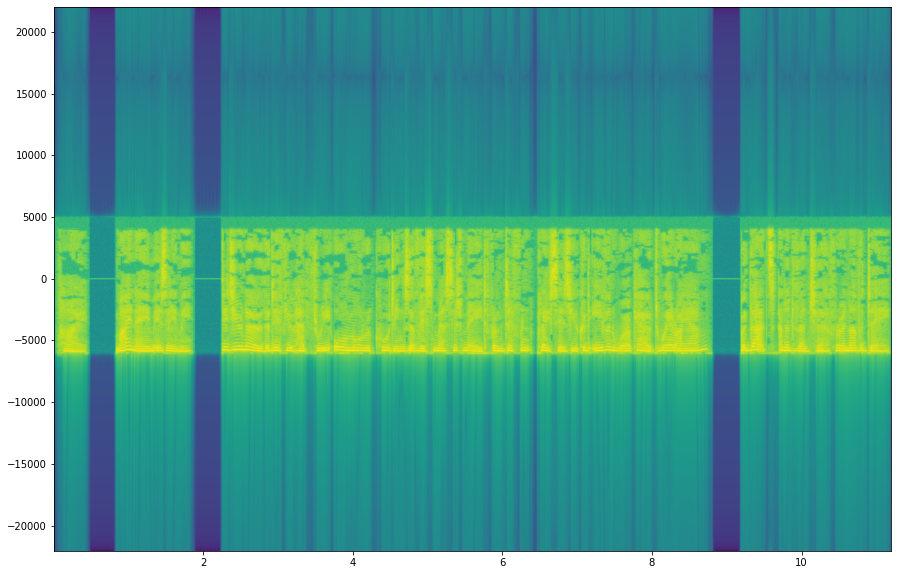

In [42]:
dechirped = filteredChirpAudio * chirpSignal
plt.specgram(dechirped+1e-6, NFFT=1024, Fs=samplerate, noverlap=900)
plt.show()

### Now convert back to real, undoing our ealier conversion to complex

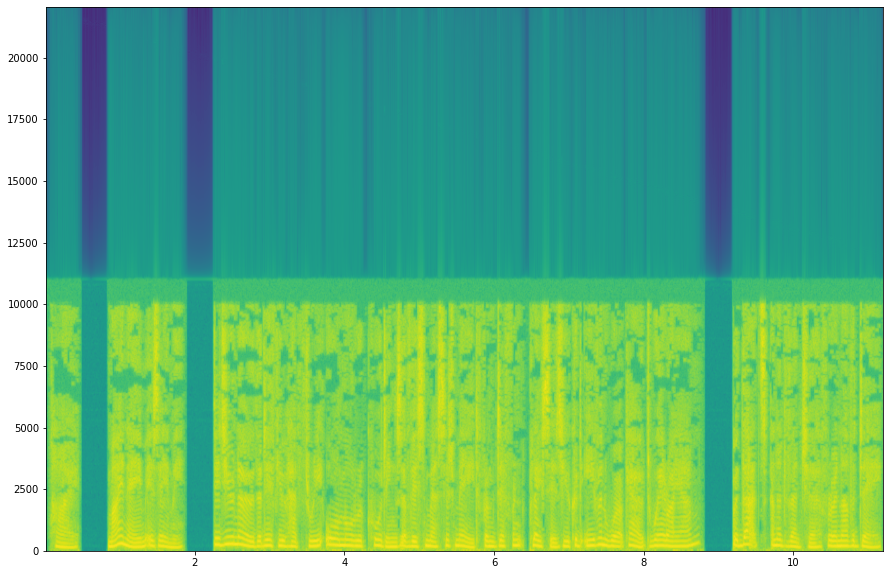

In [43]:
# Mix to real
mixFreq = samplerate / 8 + 500
mixTone = np.sin(-2*np.pi*mixFreq*t) + 1j * np.cos(-2*np.pi*mixFreq*t)
mixedAudio = dechirped * mixTone

plt.specgram(np.real(mixedAudio), NFFT=1024, Fs=samplerate, noverlap=900)
plt.show()

## Shall we listen?

In [45]:
ipd.Audio(np.real(mixedAudio), rate=samplerate)